## DAE Code
This code/document is provided for reference only. It is intended solely to demonstrate how the data can be analyzed. This is not the final version yet.

In [5]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from cellworld import World, Display, Trajectories, Step, Location, Cell_group
import ast

In [11]:
# 1.read data
# sac model
# set directory 
# Sometimes I read the data many times, because I need to make sure the final data is of similar scales to make the fair comparison
import os
os.chdir('/Users/hanshuo/Documents/project/RL/Of-Mice-and-Machines/data')
# sac model
data = pd.read_csv('SAC_data.csv')
# baseline tdmpc2
data_tdmpc = pd.read_csv('tdmpc_data.csv')
# mouse data
mouse = pd.read_csv('mouse_data.csv')
# tdmpc with memory amplification of 10
tdmpc_pan10 = pd.read_csv('tdmpc_pan10.csv')
# tdmpc with memory amplification of 1
data_tdmpc_00 = pd.read_csv('tdmpc_00.csv')
# VP-TD-MPC2 data
vp_tdmpc = pd.read_csv('vp_tdmpc.csv')
# SMIRL data without TISB
data_surprise = pd.read_csv('tdmpc_surprise.csv')
data_ptsd = pd.read_csv('tdmpc_ptsd.csv')
# 2. convert string to numpy array
data['obs'] = data['obs'].apply(lambda x: np.fromstring(x.strip('[]'), sep=' '))
data_tdmpc['obs'] = data_tdmpc['obs'].apply(lambda x: np.fromstring(x.strip('[]'), sep=' '))
mouse['obs'] = mouse['obs'].apply(lambda x: np.array(ast.literal_eval(x)))
mouse['next_obs'] = mouse['next_obs'].apply(lambda x: np.array(ast.literal_eval(x)))
vp_tdmpc['obs'] = vp_tdmpc['obs'].apply(lambda x: np.fromstring(x.strip('[]'), sep=' '))   
data_surprise['obs'] = data_surprise['obs'].apply(lambda x: np.fromstring(x.strip('[]'), sep=' '))
data_ptsd['obs'] = data_ptsd['obs'].apply(lambda x: np.fromstring(x.strip('[]'), sep=' '))
data_tdmpc_00['obs'] = data_tdmpc_00['obs'].apply(lambda x: np.fromstring(x.strip('[]'), sep=' '))
tdmpc_pan10['obs'] = tdmpc_pan10['obs'].apply(lambda x: np.fromstring(x.strip('[]'), sep=' '))

In [ ]:
# llm data 
# due to api cost the data is not very much
import pandas as pd
llm_data_1 = pd.read_csv("trajectory_data/trajectory_data_episode_0.csv")
llm_data_2 = pd.read_csv("trajectory_data/trajectory_data_episode_1.csv")
llm_data_3 = pd.read_csv("trajectory_data/trajectory_data_episode_2.csv")
llm_data_4 = pd.read_csv("trajectory_data/trajectory_data_episode_3.csv")
llm_data_5 = pd.read_csv("trajectory_data/trajectory_data_episode_4.csv")
llm_data_6 = pd.read_csv("trajectory_data/trajectory_data_episode_5.csv")
llm_data_7 = pd.read_csv("trajectory_data/trajectory_data_episode_6.csv")
llm_data_8 = pd.read_csv("trajectory_data/trajectory_data_episode_7.csv")
llm_data_9 = pd.read_csv("trajectory_data/trajectory_data_episode_8.csv")
llm_data_10 = pd.read_csv("trajectory_data/trajectory_data_episode_9.csv")
llm_data_11 = pd.read_csv("trajectory_data/trajectory_data_episode_10.csv")

llm_data_1['obs'] = llm_data_1['obs'].apply(lambda x: np.fromstring(x.strip('[]'), sep=' '))   
llm_data_2['obs'] = llm_data_2['obs'].apply(lambda x: np.fromstring(x.strip('[]'), sep=' '))   
llm_data_3['obs'] = llm_data_3['obs'].apply(lambda x: np.fromstring(x.strip('[]'), sep=' '))   
llm_data_4['obs'] = llm_data_4['obs'].apply(lambda x: np.fromstring(x.strip('[]'), sep=' ')) 
llm_data_5['obs'] = llm_data_5['obs'].apply(lambda x: np.fromstring(x.strip('[]'), sep=' ')) 
llm_dfs_tail = [llm_data_6, llm_data_7, llm_data_8, llm_data_9, llm_data_10, llm_data_11]

for df in llm_dfs_tail:
    df['obs'] = df['obs'].apply(lambda s: np.fromstring(s.strip('[]'), sep=','))

combined_series = pd.concat([
    llm_data_1['obs'],
    llm_data_2['obs'],
    llm_data_3['obs'],
    llm_data_4['obs'],
    llm_data_5['obs'],
    llm_data_6['obs'],
    llm_data_7['obs'],
    llm_data_8['obs'],
    llm_data_9['obs'],
    llm_data_10['obs'],
    llm_data_11['obs']

], ignore_index=True)

Saved figure to plot/llm_scatter_plot.pdf


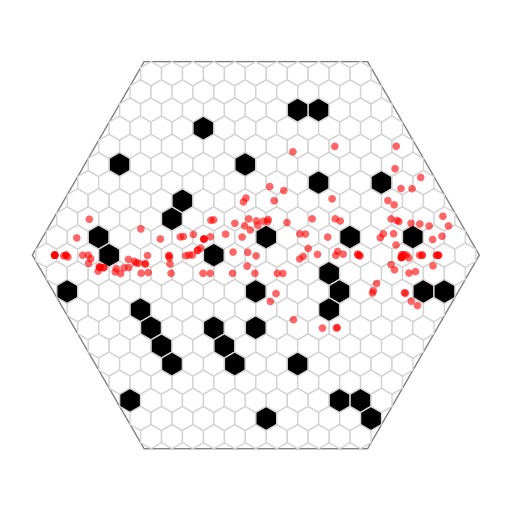

<Figure size 1000x1000 with 0 Axes>

In [24]:
import matplotlib.pyplot as plt

def plot_density(observations, title, out_pdf=None):
    world = World.get_from_parameters_names("hexagonal", "canonical", "21_05")
    fig, ax = plt.subplots(figsize=(5, 5), constrained_layout=True)
    display = Display(world, ax=ax)
    x = [pt[0] for pt in observations]
    y = [pt[1] for pt in observations]
    ax.scatter(
        x, y,
        s=30,
        alpha=0.6,
        c='red',
        marker='o',
        edgecolors='none',
        rasterized=True
    )
    
    for spine in ax.spines.values():
        spine.set_visible(False)
    
    if out_pdf:
        fig.savefig(out_pdf, format='pdf', bbox_inches='tight')
        # fig.savefig(out_pdf, format='pdf')
        print(f"Saved figure to {out_pdf}")
    else:
        plt.show()
plot_density(combined_series, "", out_pdf="plot/llm_scatter_plot.pdf")

## Define wall-following

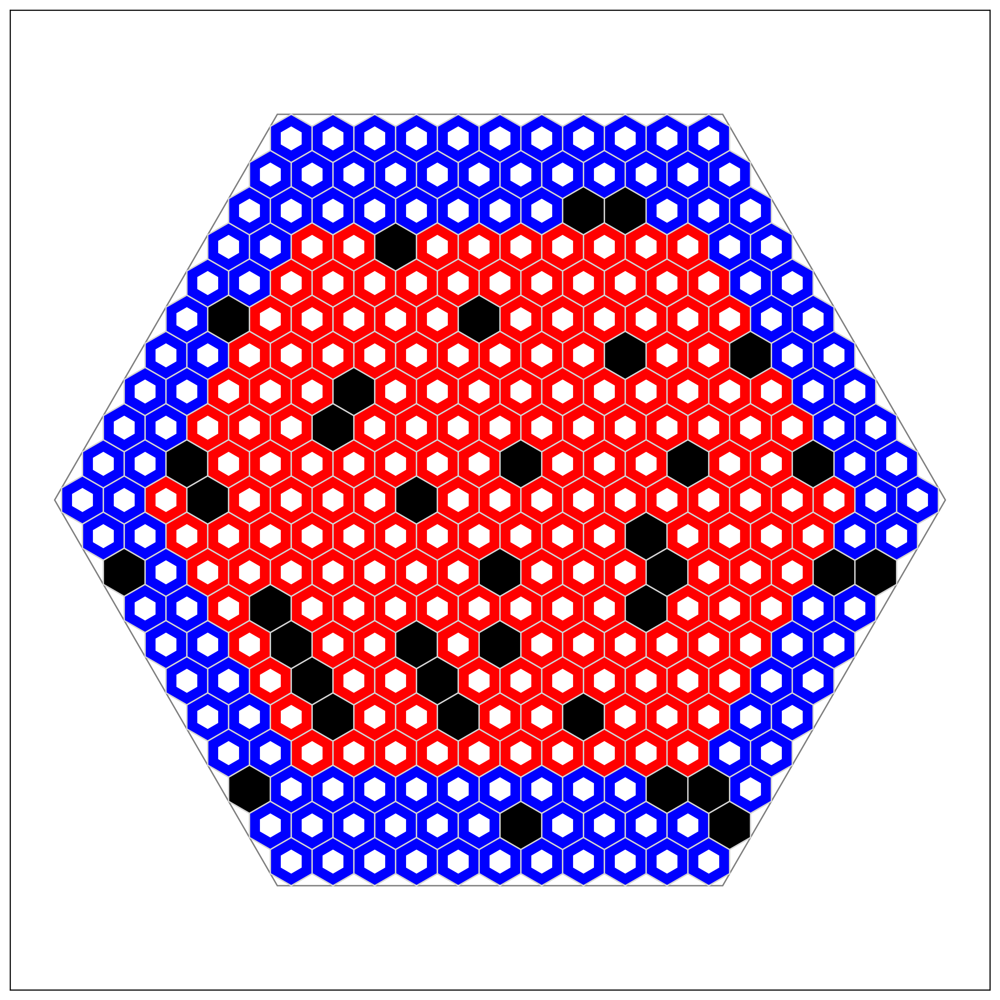

In [61]:
# Plot mouse trajectories and count wall-following paths
trajectories = []
wall_trajectories = []
not_wall_trajectories = []

trajectory = Trajectories()
time_stamp = 0
frame = 0

for i in range(len(observations)):
    step = Step(time_stamp=time_stamp, agent_name="prey", frame=frame, location=Location(observations[i][0], observations[i][1]))
    trajectory.append(step)

    time_stamp += .025
    frame += 1

    if dones[i] == 1:
        # Check if trajectory follows wall
        trajectories.append(trajectory)
        trajectory = Trajectories()
        time_stamp = 0
        frame = 0

# Add a semi-transparent background box for the text
bbox_props = dict(boxstyle='round,pad=0.5', fc='white', ec='gray', alpha=0.7)
wall_following_display = Display(world)

def is_cell_near_wall(cell):
    if abs(cell.coordinates.y) >= 8:
        return True
    else:
        if abs(cell.coordinates.y) + abs(cell.coordinates.x) >= 18:
            return True
        else:
            return False

wall_following_cells = Cell_group()

for cell in world.cells:
    if cell.occluded:
        continue
    if is_cell_near_wall(cell):
        oc = "b"
        wall_following_cells.append(cell)
    else:
        oc = "r"
    wall_following_display.cell(cell=cell, outline_color=oc)


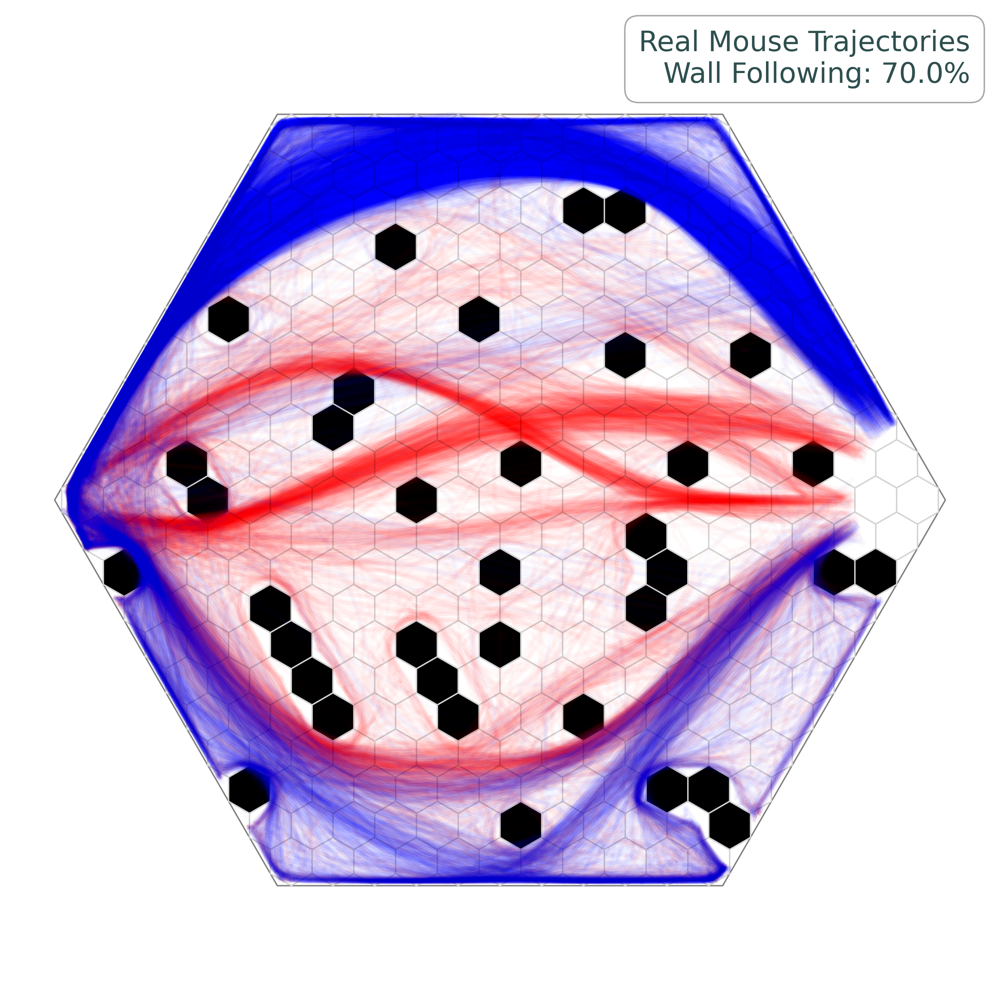

In [65]:
def is_wall_following_cellgroup(cg: Cell_group):
    wall_points = sum(1 for cell in cg if is_cell_near_wall(cell))
    if wall_points / len(cg) > 0.7:
        return True
    else:
        return False
wall_trajectories = []
not_wall_trajectories = []
for trajectory in trajectories:
    ids = set()
    for step in trajectory:
        step_cell = world.cells[world.cells.find(location=step.location)]
        ids.add(step_cell.id)
    cg = Cell_group()
    for id in ids:
        cg.append(world.cells[id])
    if is_wall_following_cellgroup(cg):
        wall_trajectories.append(trajectory)
    else:
        not_wall_trajectories.append(trajectory)

display = Display(world)
wall_following_percentage = len(wall_trajectories) / (len(wall_trajectories) + len(not_wall_trajectories)) * 100

for trajectory in not_wall_trajectories:
    display.add_trajectories(trajectories=trajectory, colors={"prey": "r"},  alphas={"prey": .02})

for trajectory in wall_trajectories:
    display.add_trajectories(trajectories=trajectory, colors={"prey": "b"}, alphas={"prey": .02})


# Add a semi-transparent background box for the text
bbox_props = dict(boxstyle='round,pad=0.5', fc='white', ec='gray', alpha=0.7)
plt.text(0.98, 0.98,
         f'Real Mouse Trajectories\nWall Following: {wall_following_percentage:.1f}%',
         horizontalalignment='right',
         verticalalignment='top',
         transform=plt.gca().transAxes,
         bbox=bbox_props,
         fontsize=20,
         color='darkslategray')

for spine in display.ax.spines.values():
    spine.set_visible(False)

plt.tight_layout()
plt.savefig("plot/mouse_trajectory_all.pdf", format='pdf', bbox_inches='tight')
# plt.show()

# plot multiple densities function

In [ ]:
# plot multiple densities
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from cellworld import World, Display
from matplotlib.colors import LinearSegmentedColormap
from shapely.geometry import Polygon, Point
import ast

value_max = 20
def plot_densities(observations_list, titles, out_pdf, colorbar_limits = (0, value_max)):
  world = World.get_from_parameters_names("hexagonal", "canonical", "21_05")

  plt.rcParams['figure.dpi'] = 300
  plt.rcParams['savefig.dpi'] = 300

  cb = 0.5
  w = 6.5
  h = 5
  fig_w = w * len(observations_list) + cb - 1
  fig, axs = plt.subplots(1, len(observations_list), figsize=(fig_w, h), constrained_layout=True)

  axes = []

  for i, (observations, title) in enumerate(zip(observations_list,titles)):
    colors_mouse = [(1, 1, 1, 0), (1, 0, 1, 1)]
    cm_mouse = LinearSegmentedColormap.from_list('mouse', colors_mouse, N=100)
    ax = axs[i]
    axes.append(ax)
    display = Display(world, ax = ax)
    x = []
    y = []
    for i in range(len(observations)):
        x.append(observations[i][0])
        y.append(observations[i][1])

    hist = display.ax.hist2d(x, y, bins=100, cmap=cm_mouse, vmin=0, vmax=value_max)
    for spine in display.ax.spines.values():
        spine.set_visible(False)

    display.ax.set_xlim(-.01, 1.01)
    display.ax.set_ylim(.05, .95)

    display.ax.text(0.5, 0.03, title, color='Black', fontsize=20, ha='center', va='center')
    

  cbar = fig.colorbar(hist[3], ax = axes, label='Density', orientation='vertical')
  cbar.set_ticks(colorbar_limits)
  cbar.set_ticklabels(colorbar_limits)
  plt.tight_layout()
  if out_pdf:
    fig.savefig(out_pdf, format='pdf', bbox_inches='tight')
    print(f"Saved figure to {out_pdf}")
  else:
    plt.show()

In [7]:
# plot single density
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from cellworld import World, Display
from matplotlib.colors import LinearSegmentedColormap
from shapely.geometry import Polygon, Point
import ast

def plot_densities(observations_list, titles, colorbar_limits = (0, 5)):
  world = World.get_from_parameters_names("hexagonal", "canonical", "21_05")

  w = 7
  h = 5
  fig, ax = plt.subplots(figsize=(w, h))

  observations = observations_list[0]
  title = titles[0]
  
  colors_mouse = [(1, 1, 1, 0), (1, 0, 1, 1)]
  cm_mouse = LinearSegmentedColormap.from_list('mouse', colors_mouse, N=100)
  
  display = Display(world, ax=ax)
  x = []
  y = []
  for i in range(len(observations)):
      x.append(observations[i][0]) 
      y.append(observations[i][1])

  hist = display.ax.hist2d(x, y, bins=100, cmap=cm_mouse, vmin=0, vmax=5)
  for spine in display.ax.spines.values():
      spine.set_visible(False)

  display.ax.set_xlim(-.01, 1.01)
  display.ax.set_ylim(.05, .95)

  display.ax.text(0.5, 0.03, title, color='Black', fontsize=20, ha='center', va='center')

  cbar = fig.colorbar(hist[3], ax=ax, label='Density', orientation='vertical')
  cbar.set_ticks(colorbar_limits)
  cbar.set_ticklabels(colorbar_limits)
  plt.tight_layout()
  plt.show()

Saved figure to plot/ptsd_density.pdf


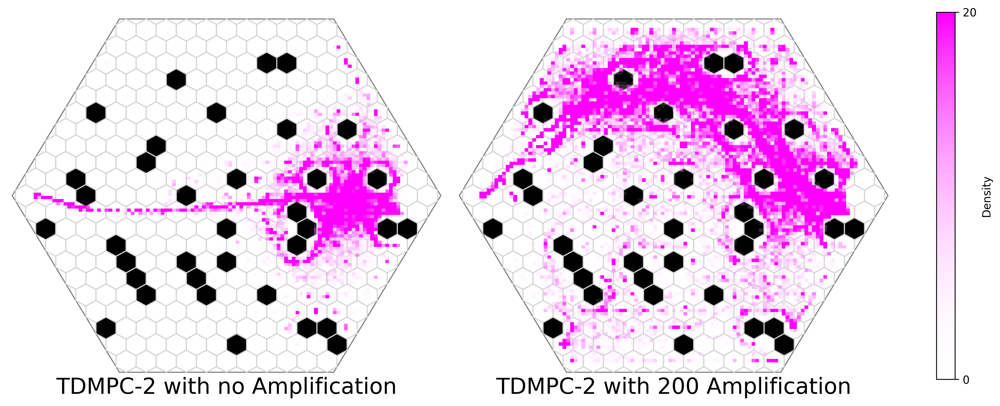

<Figure size 3000x3000 with 0 Axes>

<Figure size 3000x3000 with 0 Axes>

In [43]:
observations_list = []
titles = []
observations_list.append(data_tdmpc_00['obs'])
titles.append("TDMPC-2 with no Amplification")
observations_list.append(data_ptsd['obs'])
titles.append("TDMPC-2 with 200 Amplification")
plot_densities(observations_list, titles, out_pdf='plot/ptsd_density.pdf')


Saved figure to plot/mouse_density_and_td.pdf


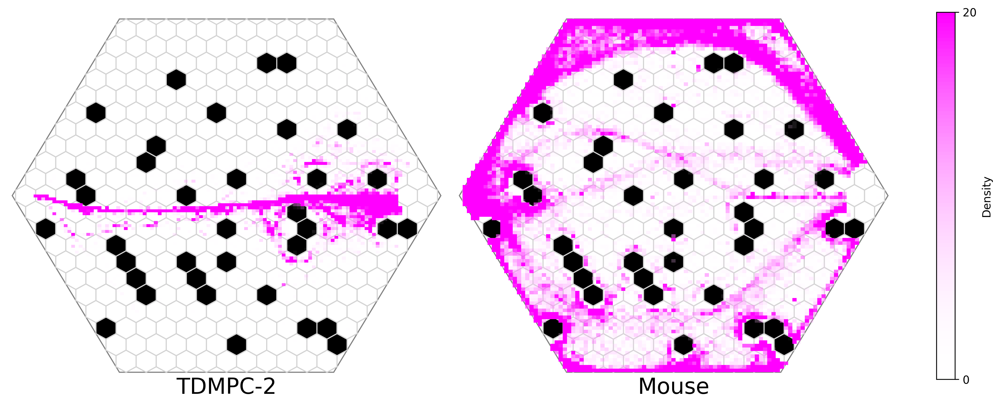

<Figure size 3000x3000 with 0 Axes>

<Figure size 3000x3000 with 0 Axes>

In [66]:
observations_list = []
titles = []
observations_list.append(data_tdmpc['obs'])
titles.append("TDMPC-2")
observations_list.append(mouse['obs'])
titles.append("Mouse")
plot_densities(observations_list, titles, out_pdf='plot/mouse_density_and_td.pdf')


Saved figure to plot/vptdmpcdensity3.pdf
Saved figure to plot/vptdmpcdensity3.pdf
Saved figure to plot/vptdmpcdensity3.pdf


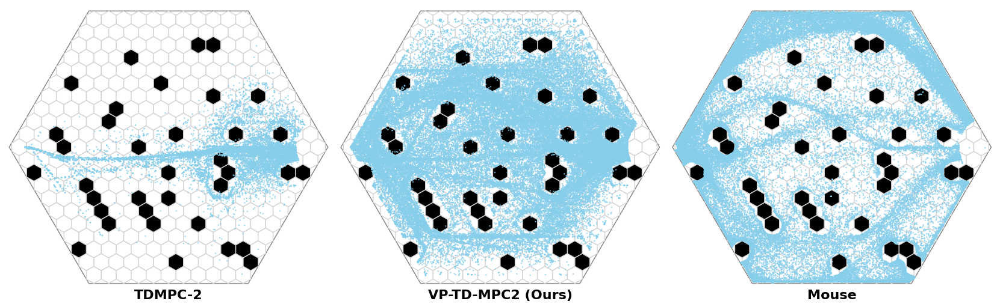

<Figure size 1000x1000 with 0 Axes>

<Figure size 1000x1000 with 0 Axes>

<Figure size 1000x1000 with 0 Axes>

In [ ]:
value_max = 10

def plot_densities(observations_list, titles, out_pdf):
  world = World.get_from_parameters_names("hexagonal", "canonical", "21_05")


  cb = 0.5
  w = 6
  h = 5
  fig_w = w * len(observations_list) + cb - 2
  fig, axs = plt.subplots(1, len(observations_list), figsize=(fig_w, h), constrained_layout=True)

  axes = []

  for i, (observations, title) in enumerate(zip(observations_list, titles)):
    ax = axs[i]
    axes.append(ax)
    display = Display(world, ax=ax)
    x = []
    y = []
    for i in range(len(observations)):
        x.append(observations[i][0])
        y.append(observations[i][1])


    scatter = display.ax.scatter(x, y, 
                                s=3,                
                                alpha=0.8,         
                                c='#87CEEB',       
                                marker='o',         
                                edgecolors='none',  
                                rasterized=True)    
    

    for spine in display.ax.spines.values():
        spine.set_visible(False)


    display.ax.set_xlim(-.01, 1.01)
    display.ax.set_ylim(.05, .95)
    
    
    display.ax.text(0.5, 0.03, title, 
                   color='black', 
                   fontsize=16, 
                   fontweight='bold',
                   ha='center', 
                   va='center')
    if out_pdf:
        # bbox_inches='tight' 可以去掉多余留白
        fig.savefig(out_pdf, format='pdf', bbox_inches='tight')
        print(f"Saved figure to {out_pdf}")
    else:
        plt.show()

  plt.tight_layout()
  
  
  # plt.show()

observations_list = []
titles = []

observations_list.append(data_tdmpc['obs'])
titles.append("TDMPC-2")

observations_list.append(vp_tdmpc['obs'])
titles.append("VP-TD-MPC2 (Ours)")

observations_list.append(mouse['obs'])
titles.append("Mouse")

plot_densities(observations_list, titles, out_pdf="plot/vptdmpcdensity3.pdf")


TD-MPC episode length statistics (filtered 5 <= length <= 50):
Average length: 7.09
Length range: [5, 46]
Standard deviation: 1.77

Mouse episode length statistics (filtered 5 <= length <= 50):
Average length: 14.04
Length range: [5, 50]
Standard deviation: 10.40

VP-TD-MPC episode length statistics (filtered 5 <= length <= 50):
Average length: 14.25
Length range: [6, 50]
Standard deviation: 6.24


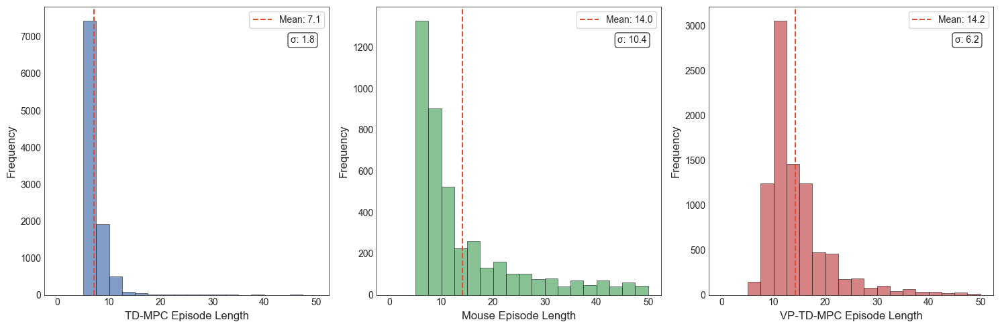

In [54]:
# Calculate episode lengths for each dataset
def calc_episode_lengths(data):
    observations = data['obs']
    dones = data['done']
    
    episode_lengths = []
    current_length = 0
    
    for i in range(len(observations)):
        current_length += 1
        if dones[i] == 1:
            episode_lengths.append(current_length)
            current_length = 0
            
    return episode_lengths

# Calculate statistics and plot for each dataset
plt.style.use('seaborn-v0_8-whitegrid')  # Use a clean style
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15, 5), facecolor='white')

datasets = [data_tdmpc, mouse, vp_tdmpc]
titles = ['TD-MPC', 'Mouse', 'VP-TD-MPC']
colors = ['#4C72B0', '#55A868', '#C44E52']  # Professional color palette

for ax, data, title, color in zip([ax1, ax2, ax3], datasets, titles, colors):
    episode_lengths = calc_episode_lengths(data)
    
    # Filter out episodes that are too short or too long
    filtered_lengths = [length for length in episode_lengths if 5 <= length <= 50]
    
    # Calculate statistics on filtered data
    avg_length = np.mean(filtered_lengths)
    min_length = np.min(filtered_lengths)
    max_length = np.max(filtered_lengths)
    std_length = np.std(filtered_lengths)
    
    print(f"\n{title} episode length statistics (filtered 5 <= length <= 50):")
    print(f"Average length: {avg_length:.2f}")
    print(f"Length range: [{min_length}, {max_length}]")
    print(f"Standard deviation: {std_length:.2f}")
    
    # Plot distribution of filtered data
    n, bins, patches = ax.hist(filtered_lengths, bins=20, range=(0,50), 
                              color=color, alpha=0.7, edgecolor='black', linewidth=0.5)
    
    # Add a vertical line for the mean
    ax.axvline(avg_length, color='#E24A33', linestyle='--', linewidth=1.5, 
              label=f'Mean: {avg_length:.1f}')
    
    # Add a text annotation for std dev
    ax.text(0.95, 0.90, f'σ: {std_length:.1f}', transform=ax.transAxes, 
           fontsize=10, va='top', ha='right',
           bbox=dict(boxstyle='round', facecolor='white', alpha=0.7))
    
    ax.set_xlabel(f'{title} Episode Length', fontsize=12)
    ax.set_ylabel('Frequency', fontsize=12)
    ax.legend(frameon=True, facecolor='white')
    
    # Remove grid
    ax.grid(False)
    
    # Set background color
    ax.set_facecolor('white')
    
    # Add spines
    for spine in ax.spines.values():
        spine.set_visible(True)
        spine.set_color('black')
        spine.set_linewidth(0.5)

plt.tight_layout()
plt.savefig('plot/episode_length_distribution.pdf', format='pdf', dpi=300, bbox_inches='tight')


data_tdmpc waiting statistics (first 1000 trajectories):
Waiting percentage: 0.00%
Waiting episodes: 0 out of 1000

mouse waiting statistics (first 1000 trajectories):
Waiting percentage: 27.70%
Waiting episodes: 277 out of 1000

vp_tdmpc waiting statistics (first 1000 trajectories):
Waiting percentage: 32.40%
Waiting episodes: 324 out of 1000


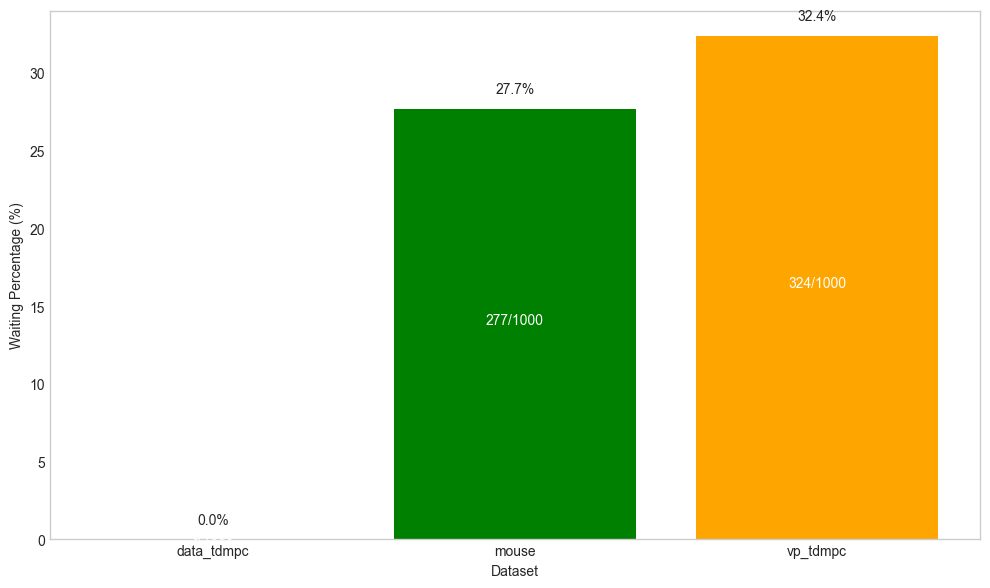

In [56]:
# Calculate waiting percentage for each dataset
def calc_waiting_percentage(data, max_trajectories=1000):
    observations = data['obs']
    dones = data['done']
    
    # Define starting point
    start_point = np.array([0, 0.5])
    waiting_threshold = 0.2
    
    total_episodes = 0
    waiting_episodes = 0
    
    episode_obs = []
    
    # Split observations into episodes, limiting to max_trajectories
    for i in range(len(observations)):
        episode_obs.append(observations[i])
        
        if dones[i] == 1:
            total_episodes += 1
            
            if len(episode_obs) >= 6:
                # Calculate distance between position at step 4 and starting point
                pos_at_step_4 = np.array(episode_obs[5][0:2])  # 4th step (index 3)
                distance = np.linalg.norm(pos_at_step_4 - start_point)
                
                if distance <= waiting_threshold:
                    waiting_episodes += 1
            
            # Reset for next episode
            episode_obs = []
            
            # Stop if we've reached the maximum number of trajectories
            if total_episodes >= max_trajectories:
                break
    
    # Calculate waiting percentage
    waiting_percentage = (waiting_episodes / total_episodes) * 100 if total_episodes > 0 else 0
    
    return waiting_percentage, waiting_episodes, total_count

# Calculate waiting percentage and plot for each dataset
fig, ax = plt.subplots(figsize=(10, 6))

datasets = [data_tdmpc_00, mouse, vp_tdmpc]
titles = ['data_tdmpc', 'mouse', 'vp_tdmpc']
colors = ['blue', 'green', 'orange']

waiting_percentages = []
waiting_counts = []
total_counts = []

for data, title in zip(datasets, titles):
    waiting_percentage, waiting_count, total_count = calc_waiting_percentage(data, max_trajectories=1000)
    waiting_percentages.append(waiting_percentage)
    waiting_counts.append(waiting_count)
    total_counts.append(total_count)
    
    print(f"\n{title} waiting statistics (first 1000 trajectories):")
    print(f"Waiting percentage: {waiting_percentage:.2f}%")
    print(f"Waiting episodes: {waiting_count} out of {total_count}")

# Plot waiting percentages
ax.bar(titles, waiting_percentages, color=colors)
ax.set_xlabel('Dataset')
ax.set_ylabel('Waiting Percentage (%)')
ax.grid(False)  # Remove grid

# Add percentage labels on top of bars
for i, v in enumerate(waiting_percentages):
    ax.text(i, v + 1, f"{v:.1f}%", ha='center')
    ax.text(i, v/2, f"{waiting_counts[i]}/{total_counts[i]}", ha='center', color='white')

plt.tight_layout()
plt.show()

# visitation pattern

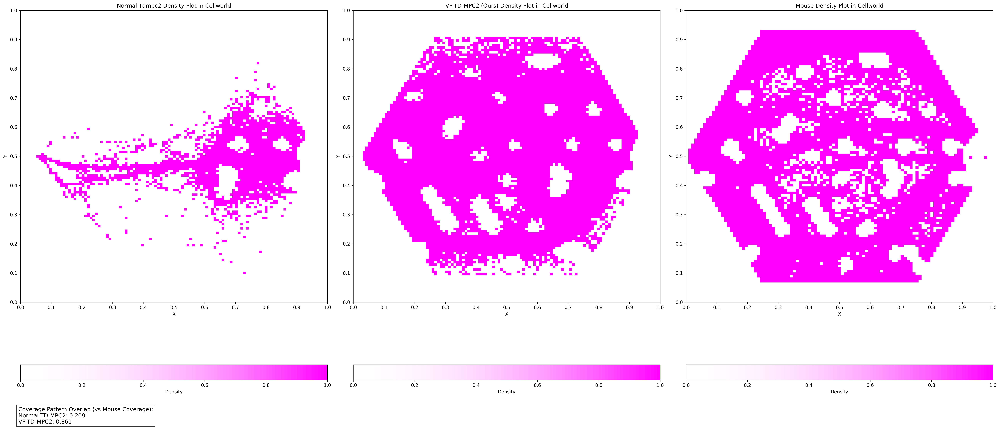

In [70]:
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
import numpy as np
fig = plt.figure(figsize=(30, 13))
fig.patch.set_alpha(0.0) 

colors_mouse = [(1, 1, 1, 0), (1, 0, 1, 1)]  
cm_mouse = LinearSegmentedColormap.from_list('mouse', colors_mouse, N=100)

for idx, data_name in enumerate(['data_tdmpc', 'vp_tdmpc', 'mouse']):
    ax = plt.subplot(1, 3, idx + 1)
    ax.patch.set_alpha(0.0)  
    
    if data_name == 'mouse':
        observations = mouse['obs']  
    elif data_name == 'data_tdmpc':
        observations = data_tdmpc['obs']  
    else:
        observations = vp_tdmpc['obs']
    
    x = [obs[0] for obs in observations]
    y = [obs[1] for obs in observations]
    
    h = plt.hist2d(x, y, bins=100, cmap=cm_mouse, vmin=0, vmax=1)
    plt.colorbar(h[3], label='Density', orientation='horizontal')
    
    title_map = {
        'data_tdmpc': 'Normal Tdmpc2',
        'vp_tdmpc': 'VP-TD-MPC2 (Ours)',
        'mouse': 'Mouse'
    }
    plt.title(f'{title_map[data_name]} Density Plot in Cellworld')
    plt.xlabel('X')
    plt.ylabel('Y')
    plt.xticks(np.arange(0, 1.05, 0.1))
    plt.yticks(np.arange(0, 1.05, 0.1))
    plt.grid(False)

plt.tight_layout()

def compute_coverage_overlap(hist1, hist_mouse, threshold=0):
    coverage1 = (hist1[0] > threshold).astype(int)
    coverage_mouse = (hist_mouse[0] > threshold).astype(int)
    
    intersection = np.sum(coverage1 & coverage_mouse)
    mouse_coverage = np.sum(coverage_mouse)
    
    overlap = intersection / mouse_coverage if mouse_coverage > 0 else 0
    return overlap

hist_tdmpc = np.histogram2d([obs[0] for obs in data_tdmpc['obs']], 
                           [obs[1] for obs in data_tdmpc['obs']], 
                           bins=100)
hist_mouse = np.histogram2d([obs[0] for obs in mouse['obs']], 
                          [obs[1] for obs in mouse['obs']], 
                          bins=100)
overlap_tdmpc = compute_coverage_overlap(hist_tdmpc, hist_mouse)

hist_tdmpc20 = np.histogram2d([obs[0] for obs in vp_tdmpc['obs']], 
                             [obs[1] for obs in vp_tdmpc['obs']], 
                             bins=100)
overlap_tdmpc20 = compute_coverage_overlap(hist_tdmpc20, hist_mouse)

plt.figtext(0.02, 0.02, f'Coverage Pattern Overlap (vs Mouse Coverage):\nNormal TD-MPC2: {overlap_tdmpc:.3f}\nVP-TD-MPC2: {overlap_tdmpc20:.3f}', 
            fontsize=12, bbox=dict(facecolor='white', alpha=0.8))

plt.show()

# plot single trajectories

In [ ]:
# 3. plot mouse trajectories
from cellworld import World, Display
import random
import numpy as np

# reset plot
plt.clf()

def is_inside_hexagon(x, y, center_x=0.5, center_y=0.5):
    """Check if point (x,y) is inside the hexagonal world"""
    # Convert to local coordinates
    x = x - center_x
    y = y - center_y
    
    # Regular hexagon with width=1
    # Height = sqrt(3)/2 ≈ 0.866
    height = np.sqrt(3)/2
    
    # Check if point is inside hexagon using inequalities
    if abs(y) <= height/2:  # Check vertical bounds
        return abs(x) <= 0.5 - (abs(y)/(height/2)) * 0.5
    return False

def plot_n_trajectories(observations, dones, n=10, noise_level=0.02):
    world = World.get_from_parameters_names("hexagonal", "canonical", "21_05")
    Display(world,animated=True, show_axes=False)
    all_trajectories = []
    trajectory_x = []
    trajectory_y = []
    
    for i in range(len(observations)):
        # Try adding noise until we get a valid point
        max_attempts = 10
        x, y = observations[i][0], observations[i][1]
        
        for _ in range(max_attempts):
            noisy_x = x + np.random.normal(0, noise_level)
            noisy_y = y + np.random.normal(0, noise_level)
            
            if is_inside_hexagon(noisy_x, noisy_y):
                x, y = noisy_x, noisy_y
                break
        
        trajectory_x.append(x)
        trajectory_y.append(y)
        if dones[i] == 1:
            # Add the goal point since environment resets too quickly
            trajectory_x.append(0.95)
            trajectory_y.append(0.5)
            all_trajectories.append((trajectory_x.copy(), trajectory_y.copy()))
            trajectory_x = []
            trajectory_y = []
    # plt.xticks(np.arange(0, 1.05, 0.2), fontsize=10)
    # plt.yticks(np.arange(0, 1.05, 0.2), fontsize=10)
    
    
    # Randomly select n trajectories
    selected_trajectories = random.sample(all_trajectories, min(n, len(all_trajectories)))
    
    for traj_x, traj_y in selected_trajectories:
        plt.plot(traj_x, traj_y, linestyle='-', alpha=1, color='b')
    # plt.xlabel('X')
    # plt.ylabel('Y')
    plt.grid(False)
    plt.show()


# Plot 5 trajectories in separate subplots
fig, axes = plt.subplots(1, 5, figsize=(25, 5))
for ax in axes:
    plt.sca(ax)
    plot_n_trajectories(mouse['obs'], mouse['done'], n=1, noise_level=0.02)
plt.show()

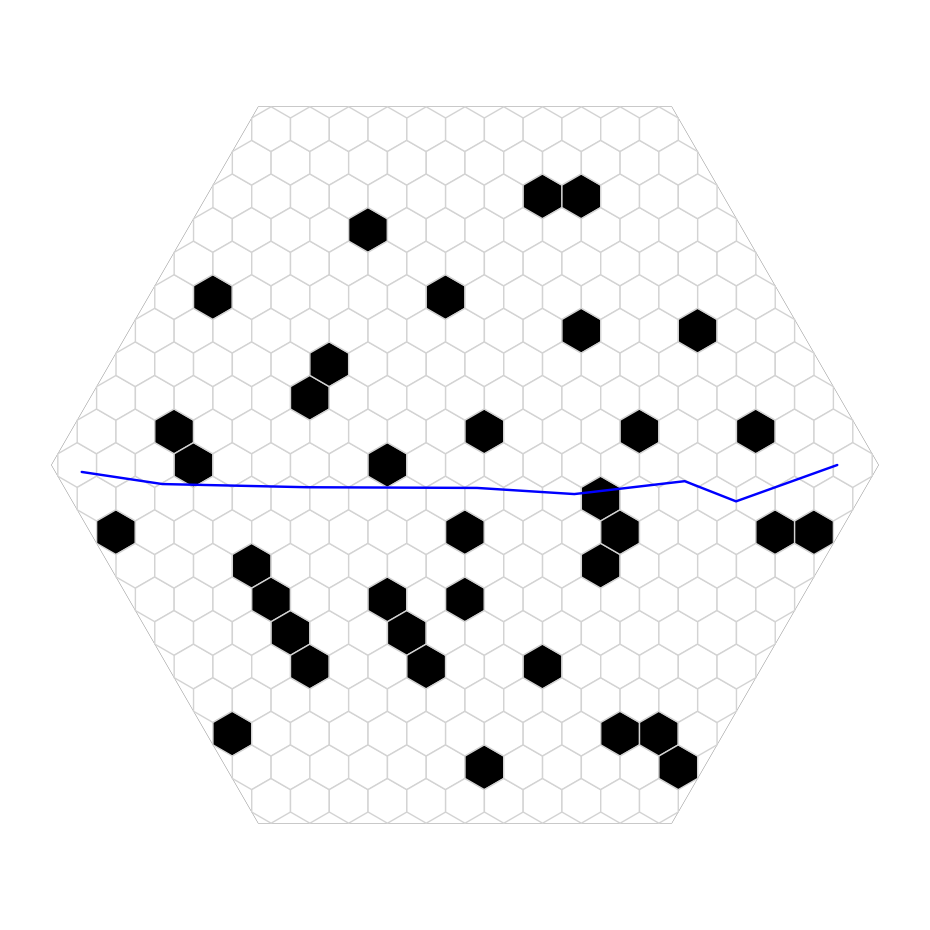

In [228]:
plot_n_trajectories(data_tdmpc['obs'], data_tdmpc['done'], n=1)

# Final analysis

In [84]:
import numpy as np
import matplotlib.pyplot as plt

def analyze_pre_predator_behavior(df, name):
    pre_sight_changes = []
    current_traj = []
    sequence_length = 3

    for idx, row in df.iterrows():
        current_traj.append(row)
        
        if row['done'] or idx == len(df) - 1:
            for t in range(len(current_traj)):
                current_obs = current_traj[t]['obs']
                
                is_first_sight = (current_obs[3] != 0 and current_obs[4] != 0) and \
                                (t == 0 or (current_traj[t-1]['obs'][3] == 0 and current_traj[t-1]['obs'][4] == 0))
                
                if is_first_sight and t >= sequence_length:
                    changes = []
                    base_distance = current_traj[t-sequence_length]['obs'][6] 
                    
                    for step in range(1, sequence_length + 1):
                        next_distance = current_traj[t-sequence_length+step]['obs'][6]
                        delta = next_distance - base_distance
                        changes.append(delta)
                    
                    pre_sight_changes.append(changes)
            
            current_traj = []
    
    return pre_sight_changes

In [83]:
import numpy as np
import matplotlib.pyplot as plt

def analyze_dataset(df, name):
    distance_changes = []
    current_traj = []
    sequence_length = 3

    for idx, row in df.iterrows():
        current_traj.append(row)
        
        if row['done'] or idx == len(df) - 1:
            for t in range(len(current_traj)):
                if t + sequence_length < len(current_traj):
                    current_obs = current_traj[t]['obs']
                    
                    is_first_sight = (current_obs[3] != 0 and current_obs[4] != 0) and \
                                    (t == 0 or (current_traj[t-1]['obs'][3] == 0 and current_traj[t-1]['obs'][4] == 0))
                    
                    if is_first_sight:
                        changes = []
                        initial_distance = current_obs[6]
                        for step in range(1, sequence_length + 1):
                            next_distance = current_traj[t + step]['obs'][6]
                            delta = next_distance - initial_distance
                            changes.append(delta)
                        distance_changes.append(changes)
            current_traj = []
    
    if distance_changes:
        avg_changes = np.mean(distance_changes, axis=0)
        std_changes = np.std(distance_changes, axis=0)
        
        final_avg_change = avg_changes[-1]
        positive_ratio = np.mean([1 if change[-1] > 0 else 0 for change in distance_changes]) * 100
        
        print(f"\n=== {name} Statistics ===")
        print(f"Number of encounters analyzed: {len(distance_changes)}")
        print(f"Average distance change after {sequence_length} steps: {final_avg_change:.3f}")
        print(f"Percentage of fleeing responses: {positive_ratio:.1f}%")
        
        return avg_changes, std_changes, len(distance_changes)
    return None, None, 0

In [81]:
def analyze_initial_steps(df, name, n_steps=3):
    trajectories = []
    current_traj = []
    
    for idx, row in df.iterrows():
        current_traj.append(row)
        
        if row['done'] or idx == len(df) - 1:
           
            initial_steps = current_traj[:n_steps]
            if len(initial_steps) == n_steps:  

                start_pos = initial_steps[0]['obs'][:2]  
                distances = []
                for step in initial_steps:
                    current_pos = step['obs'][:2]
                    dist = np.linalg.norm(current_pos - start_pos)
                    distances.append(dist)
                trajectories.append(distances)
            current_traj = []
    
    trajectories = np.array(trajectories)

    mean_traj = np.mean(trajectories, axis=0)
    std_traj = np.std(trajectories, axis=0)
    
    print(f"\n=== {name} Initial Steps Analysis ===")
    print(f"Number of trajectories: {len(trajectories)}")
    print(f"Average initial pattern: {mean_traj}")
    print(f"Standard deviation: {std_traj}")
    
    return trajectories, mean_traj, std_traj

In [82]:
def analyze_initial_positions(df, name, n_steps=3):
    trajectories = []
    current_traj = []
    
    for idx, row in df.iterrows():
        current_traj.append(row)
        
        if row['done'] or idx == len(df) - 1:
            initial_steps = current_traj[:n_steps]
            if len(initial_steps) == n_steps:
                positions = [step['obs'][:2] for step in initial_steps] 
                if all(pos[0] <= 0.5 for pos in positions):
                    trajectories.append(positions)
            current_traj = []
    
    return np.array(trajectories)


=== tdmpc Statistics ===
Number of encounters analyzed: 6798
Average distance change after 3 steps: -0.371
Percentage of fleeing responses: 0.8%

=== TDMPC Cautious Statistics ===
Number of encounters analyzed: 11856
Average distance change after 3 steps: -0.198
Percentage of fleeing responses: 11.0%

=== Mouse Statistics ===
Number of encounters analyzed: 1932
Average distance change after 3 steps: -0.141
Percentage of fleeing responses: 22.9%

=== tdmpc Initial Steps Analysis ===
Number of trajectories: 2559
Average initial pattern: [0.         0.05474157 0.20457201 0.40199883 0.53715859 0.61550667
 0.68340849 0.75391355]
Standard deviation: [0.         0.03956839 0.07487514 0.09319128 0.07800939 0.06723342
 0.07195707 0.07324031]

=== TDMPC Cautious Initial Steps Analysis ===
Number of trajectories: 6892
Average initial pattern: [0.         0.03544094 0.09595148 0.16765161 0.25029957 0.33244734
 0.4105467  0.48672058]
Standard deviation: [0.         0.03445759 0.08157656 0.12028328

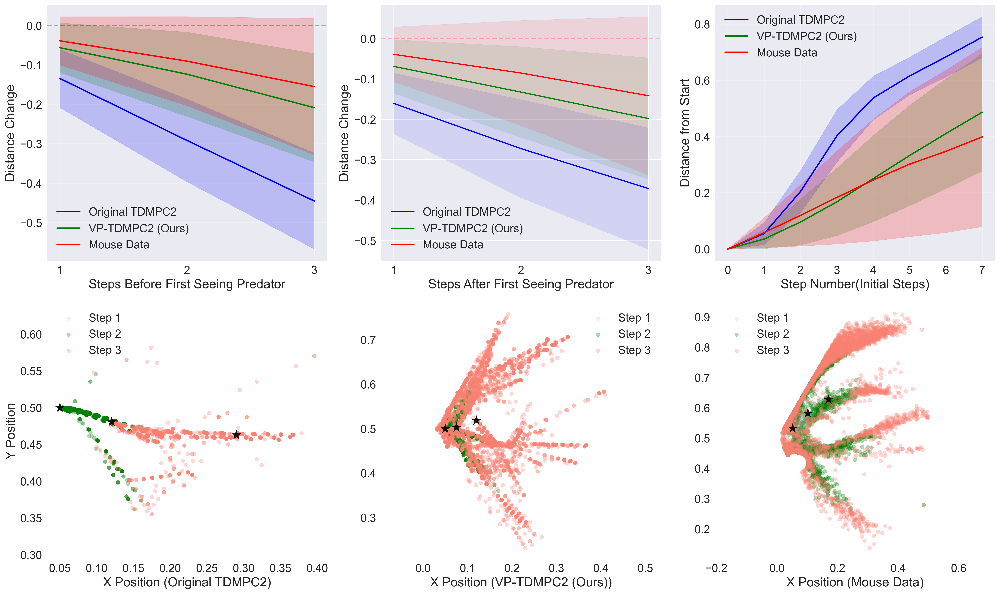

In [ ]:
datasets = [
    (data_tdmpc, "tdmpc", 'blue'),
    (vp_tdmpc, "TDMPC Cautious", 'green'),
    (mouse, "Mouse", 'red')
]
from matplotlib import gridspec

plt.rcParams.update({'font.size': 16,  
                    'axes.labelsize': 18,  
                    'axes.titlesize': 20, 
                    'xtick.labelsize': 16,  
                    'ytick.labelsize': 16,  
                    'legend.fontsize': 16}) 


plt.figure(figsize=(20, 12))
gs = gridspec.GridSpec(2, 3, height_ratios=[1, 1])


ax1 = plt.subplot(gs[0, 0])
for df, name, color in datasets:
    pre_sight_changes = analyze_pre_predator_behavior(df, name)
    if pre_sight_changes:
        mean_changes = np.mean(pre_sight_changes, axis=0)
        std_changes = np.std(pre_sight_changes, axis=0)
        steps = np.arange(1, len(mean_changes) + 1)

        label = 'Mouse Data' if name == 'Mouse' else \
            'Original TDMPC2' if name == 'tdmpc' else \
            'VP-TDMPC2 (Ours)'
        ax1.plot(steps, mean_changes, '-', color=color, 
                label=label, linewidth=2)
        ax1.fill_between(steps, mean_changes - std_changes, 
                        mean_changes + std_changes, color=color, alpha=0.2)
ax1.axhline(y=0, color='black', linestyle='--', alpha=0.3)
ax1.set_xlabel('Steps Before First Seeing Predator')
ax1.set_ylabel('Distance Change')
ax1.grid(True, alpha=0.3)
ax1.legend()
ax1.xaxis.set_major_locator(plt.MaxNLocator(integer=True))

ax2 = plt.subplot(gs[0, 1])
for df, name, color in datasets:
    avg_changes, std_changes, n = analyze_dataset(df, name)
    if avg_changes is not None:
        steps = np.arange(1, len(avg_changes) + 1)
        label = 'Mouse Data' if name == 'Mouse' else \
            'Original TDMPC2' if name == 'tdmpc' else \
            'VP-TDMPC2 (Ours)'
        ax2.plot(steps, avg_changes, '-', color=color, label=label)
        ax2.fill_between(steps, avg_changes - std_changes, 
                        avg_changes + std_changes, alpha=0.1, color=color)
ax2.axhline(y=0, color='r', linestyle='--', alpha=0.3)
ax2.set_xlabel('Steps After First Seeing Predator')
ax2.set_ylabel('Distance Change')
ax2.grid(True)
ax2.legend()
ax2.xaxis.set_major_locator(plt.MaxNLocator(integer=True))

ax3 = plt.subplot(gs[0, 2])
n_steps = 8
for df, name, color in datasets:
    trajectories, mean_traj, std_traj = analyze_initial_steps(df, name, n_steps)
    label = 'Mouse Data' if name == 'Mouse' else \
            'Original TDMPC2' if name == 'tdmpc' else \
            'VP-TDMPC2 (Ours)'
    ax3.plot(range(n_steps), mean_traj, '-', color=color, 
            label=label, linewidth=2)
    ax3.fill_between(range(n_steps), mean_traj - std_traj,
                    mean_traj + std_traj, color=color, alpha=0.2)
ax3.set_xlabel('Step Number(Initial Steps)')
ax3.set_ylabel('Distance from Start')
ax3.grid(True, alpha=0.3)
ax3.legend()

n_steps = 3
step_colors = ['lightblue', 'green', 'salmon']
for i, (df, name, color) in enumerate(datasets):
    ax = plt.subplot(gs[1, i])
    positions = analyze_initial_positions(df, name, n_steps)
    
    for step in range(n_steps):
        ax.scatter(positions[:, step, 0], positions[:, step, 1],
                  c=step_colors[step], alpha=0.3, label=f'Step {step+1}',
                  s=30, zorder=1)
        
        mean_pos = np.mean(positions[:, step], axis=0)
        ax.scatter(mean_pos[0], mean_pos[1], c='black', marker='*',
                  s=200, alpha=0.9, zorder=2)
    

    title = 'Mouse Data' if name == 'Mouse' else \
            'Original TDMPC2' if name == 'tdmpc' else \
            'VP-TDMPC2 (Ours)'
    ax.set_xlabel(f'X Position ({title})')
    if i == 0:  
        ax.set_ylabel('Y Position')
    ax.grid(True, alpha=0.3)
    ax.legend()  
    ax.set_facecolor('white')
    ax.axis('equal')

plt.tight_layout()
plt.savefig("plot/all.pdf", 
            dpi=100,        
            bbox_inches="tight",
            metadata={"CreationDate": None}, 
            transparent=True)
plt.show()